# Built-in Tasks

This tutorial covers using the built-in tasks available in SEGAR: PuttPutt,
Invisiball, and Billiards.

First, let's set up our simulator and our RGB observation space based on CIFAR
features.

In [6]:
from segar.configs.handler import get_env_config
from segar.mdps.mdps import MDP
from segar.mdps.observations import RGBObservation
from segar.sim import Simulator


vis_config = get_env_config('visual', 'linear_ae', 'five')


sim = Simulator()

# Here we render to 256x256, but you might want to use something smaller for
# your agent.
observations = RGBObservation(resolution=256, config=vis_config)

/Users/rdevonhjelm/Library/Mobile Documents/com~apple~CloudDocs/Code/segar/segar/__init__.py:26: UserWarning: Overwriting sim. This can have unexpected consequences if using old sim objects somewhere.
  warnings.warn("Overwriting sim. This can have unexpected "


### PuttPutt

Next, let's make the PuttPutt initialization and task. There are some
convenient configs useful for setting up the initialization object. These
can be found at [puttputt.py](https://github.com/microsoft/segar/blob/main/segar/tasks/puttputt.py)
for more details.

In [7]:
from segar.tasks.puttputt import PuttPuttInitialization, PuttPutt

init_config = get_env_config('initialization', 'puttputt', 'random_middle')
initialization = PuttPuttInitialization(config=init_config)
puttputt = PuttPutt(initialization=initialization)

Now build the MDP, initialize, and generate some trajectories.

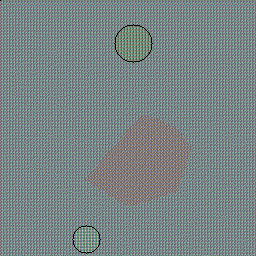

In [8]:
from IPython.display import Image, display

from segar.tools.sample_trajectories import rollout, save_gif

mdp = MDP(observations, puttputt)

imgs, trajectories = rollout(mdp)

save_gif(imgs, out_path='../../resources/readme-images/segar/tasks/puttputt_sample.gif')
Image(open('../../resources/readme-images/segar/tasks/puttputt_sample.gif','rb').read())

Note this is what your agent sees. Note that we drew a initialization
configuation from a preset, we can define our own, for instance if we want
the golf ball and goal in different locations. The
[initialization module](https://github.com/microsoft/segar/blob/main/segar/mdps/initializations.py)
has a convenient typing for arena locations:

[Position <- RandomMiddleLocation, Position <- RandomBottomLocation (if is GolfBall), Position <- RandomTopLocation (if is GoalTile), Shape <- RandomConvexHull(p=[[-0.43854748 -0.11083382]
 [-0.10935095 -0.32398892]
 [ 0.27303159 -0.20386181]
 [ 0.39069412  0.13890194]
 [ 0.26679991  0.29669249]
 [ 0.02285002  0.39478185]
 [-0.05108903  0.33422628]]) (if is Tile), Shape <- Circle(r=0.15) (if is GoalTile), Size <- GaussianNoise (if is Object), Size <- GaussianNoise (if is Tile), Mass <- 1.0, Mobile <- True, Charge <- GaussianMixtureNoise (if is Charger), Magnetism <- GaussianMixtureNoise (if is Magnet), Friction <- UniformNoise (if is SandTile)]


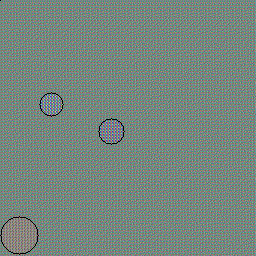

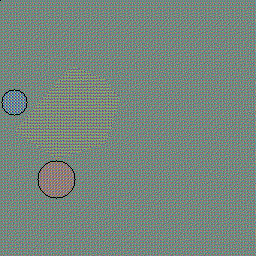

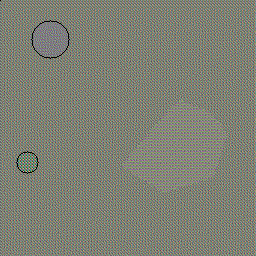

In [9]:
from copy import deepcopy

from segar.sim.location_priors import RandomLeftLocation, RandomRightLocation
from segar.tasks.puttputt import puttputt_random_middle_config, GolfBall, GoalTile
from segar.rules import Prior
from segar.factors import Position

print(puttputt_random_middle_config['priors'])

# If you inherit from other configs, make sure to copy!
all_left_config = deepcopy(puttputt_random_middle_config)
all_left_config['priors'][1] = Prior(Position, RandomLeftLocation(), entity_type=GolfBall)
all_left_config['priors'][2] = Prior(Position, RandomLeftLocation(), entity_type=GoalTile)

all_right_config = deepcopy(puttputt_random_middle_config)
all_right_config['priors'][1] = Prior(Position, RandomRightLocation(), entity_type=GolfBall)
all_right_config['priors'][2] = Prior(Position, RandomRightLocation(), entity_type=GoalTile)

initialization_left = PuttPuttInitialization(config=all_left_config)
puttputt_left = PuttPutt(initialization=initialization_left)
mdp_left = MDP(observations, puttputt_left)

initialization_right = PuttPuttInitialization(config=all_right_config)
puttputt_right = PuttPutt(initialization=initialization_right)
mdp_right = MDP(observations, puttputt_right)

for i in range(3):
    imgs, trajectories = rollout(mdp_left)
    out_path = f'../../resources/readme-images/segar/tasks/puttputt_left_{i}.gif'
    save_gif(imgs, out_path=out_path)
    display(Image(open(out_path,'rb').read()))

All on the left. Now for the right.

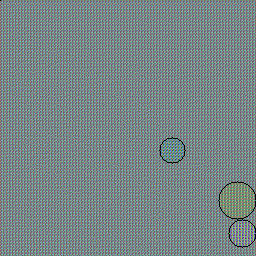

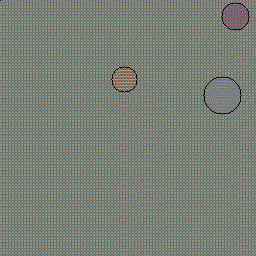

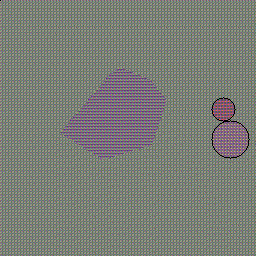

In [10]:
for i in range(3):
    imgs, trajectories = rollout(mdp_right)
    out_path = f'../../resources/readme-images/segar/tasks/puttputt_right_{i}.gif'
    save_gif(imgs, out_path=out_path)
    display(Image(open(out_path,'rb').read()))

### Iniviball

Invisiball is a variant of PuttPutt, but with two differences:
* The golf ball is only visible for the first frame.
* There are always Charger objects. This is because we need to guarantee
some long-range forces are in play.

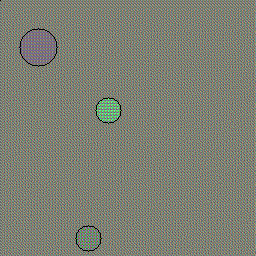

In [11]:
from segar.tasks.puttputt import Invisiball

init_config = get_env_config('initialization', 'invisiball', 'default')

initialization = PuttPuttInitialization(config=init_config)

invisiball = Invisiball(initialization=initialization)

mdp = MDP(observations, invisiball)

imgs, trajectories = rollout(mdp)

save_gif(imgs, out_path='../../resources/readme-images/segar/tasks/invisiball_sample.gif')
Image(open('../../resources/readme-images/segar/tasks/invisiball_sample.gif','rb').read())

### Billiards

Billiards is what you would expect: control the cue ball, get the balls into
 the holes, avoid scratching.

{'numbers': [(CueBall, 1)], 'priors': [Size <- GaussianNoise (if is CueBall), Size <- 0.2 (if is Ball), Mass <- 1.0 (if is Ball), Size <- 0.3 (if is Hole), Position <- RandomBottomLocation (if is CueBall)]}


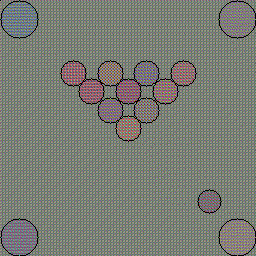

In [12]:
from segar.tasks.billiards import Billiards, BilliardsInitialization

init_config = get_env_config('initialization', 'billiards', 'default')

print(init_config)

initialization = BilliardsInitialization(config=init_config)

billiards = Billiards(initialization=initialization)

mdp = MDP(observations, billiards)

imgs, trajectories = rollout(mdp)

save_gif(imgs, out_path='../../resources/readme-images/segar/tasks/billiards_sample.gif')
Image(open('../../resources/readme-images/segar/tasks/billiards_sample.gif','rb').read())

And that's it. It's fairly easy to make your own tasks, so dive into the
built-in examples to learn more.